# Análise exploratória da nuScenes

## Introdução

A base de dados que será explorada nesse notebook é a [nuScenes](https://www.nuscenes.org/nuscenes). Esta base possui 1000 cenas (vídeos de aproximadamente 20 segundos) de um carro que possui diversos sensores acoplados à ele. Importante ressaltar que neste notebook estamos usando a base de dados sem nenhum complemento, como lidarseg ou o panoptic.

As cenas foram coletadas por um veículo percorrendo ruas em Boston e Singapura. O carro utilizado possuia os seguintes sensores (mais especificações sobre os sensores podem ser consultadas no [site da base de dados](https://www.nuscenes.org/nuscenes#data-collection)):

- 1x LiDAR (Velodyne HDL32E);
- 6x Cameras (Basler acA1600-60gc);
- 5x RADAR (Continental ARS 408-21);
- 1x IMU & GPS ([Advanced Navigation Spatial](https://www.advancednavigation.com/inertial-navigation-systems/mems-gnss-ins/spatial/)).

Uma ilustração do carro utilizado e seus sensores pode ser consultada logo abaixo:

![ilustração do carro e seus sensores](../../images/car-ilustration.png)

A base de dados também possui anotações de *bounding boxes 3D* em 2Hz (2 frames anotados por segundo). Foram usadas 23 classes diferentes de objetos, sendo estas classes, por exemplo, pedestres, carros, bicicletas, etc. Todas as possíveis classes e outras informações relacionadas à elas podem ser consultadas no [site da base de dados](https://www.nuscenes.org/nuscenes#data-annotation).

Ao todo, a base de dados possui aproximadamente:

- 1,4 milhões de imagens de câmera;
- 390 mil varreduras de LiDAR;
- 1,4 milhões de varreduras de RADAR;
- 1,4 milhões de *bounding boxes 3D* anotados;
- 40 mil *keyframes* (frames que possuem anotações, com todos os sensores com entradas em momentos semelhantes).

**Observação**

Neste notebook não será trabalhado com a base de dados completa, e sim uma versão reduzida. Como este notebook tem o intuíto de entender melhor o funcionamento da base de dados (não sendo realizada nenhuma especie de treinamento de modelos de aprendizado de máquina), não há problemas em utilizar essa versão reduzida.

Essa base reduzida possui apenas 10 cenas, totalizando 3 GB (a base completa possui centenas de GBs). Com isso, fica mais fácil de instalar os componentes necessários para executar este notebook e de executar em computadores menos potentes. Mais adiante no notebook existe uma seção contendo um tutorial para instalar essa versão da base de dados.

## Links úteis

**Artigo científico sobre a base de dado**
- [nuScenes: A Multimodal Dataset for Autonomous Driving](https://ieeexplore-ieee-org.ez31.periodicos.capes.gov.br/document/9156412)

**Página web sobre a base de dados**
- https://www.nuscenes.org/nuscenes

**Tutoriais oficiais**
- https://github.com/nutonomy/nuscenes-devkit/tree/master#getting-started-with-nuscenes
- https://www.nuscenes.org/nuscenes?tutorial=nuscenes#tutorials
- https://github.com/nutonomy/nuscenes-devkit/blob/master/python-sdk/tutorials/nuscenes_tutorial.ipynb

**Documentação**
- [FAQ](https://github.com/nutonomy/nuscenes-devkit/blob/master/docs/faqs.md)
- [Instalação da base de dados de forma cru (sem o PIP)](https://github.com/nutonomy/nuscenes-devkit/blob/master/docs/installation.md)
- [Schema completo da base de dados nuScenes](https://github.com/nutonomy/nuscenes-devkit/blob/master/docs/schema_nuscenes.md)

## Instalação

Para conseguir executar as células desse notebook, é preciso ter instalado a biblioteca `nuscenes-devkit`. Esta biblioteca possui várias funcionalidades para manipular a base de dados da nuScene.

OBS: a instalação do `opencv-python` foi forçada para ser feita na versão `4.5.4.58` (mais antiga). Provavelmente, na versão 3.7 do Python (versão recomendada pela biblioteca `nuscenes-devkit`) as versões mais recentes do `opencv` não funcionam (que deve funcionar em versões mais recentes do Python). A versão `4.5.4.58` é a versão mínima exigida pela biblioteca `nuscenes-devkit`.

In [1]:
%pip install opencv-python==4.5.4.58 --quiet
%pip install nuscenes-devkit --quiet

Note: you may need to restart the kernel to use updated packages.


Note: you may need to restart the kernel to use updated packages.


Além de instalar as bibliotecas, é preciso baixar a base de dados. Neste notebook, está sendo utilizado a versão reduzida (`v1.0-mini`). Está versão da base de dados pode ser baixada no seguinte link: https://www.nuscenes.org/nuscenes#download

Para conseguir baixar, é preciso se registrar no site. Ao finalizar o registro, faça o login e escolha fazer download da versão `1.0-mini` da base de dados `nuScenes`, como mostrado na imagem abaixo:

![print screen indicando onde baixar](../../images/download-tutorial.png)

Após o término do download, extraia os arquivos na pasta `data`.

## Importações

A seguir estão os comandos para importar as bibliotecas necessárias para executar o notebook por completo

In [45]:
%matplotlib inline
from nuscenes.nuscenes import NuScenes
import matplotlib.pyplot as plt
from nuscenes.utils.splits import create_splits_scenes

## Explorando a base de dados

A base de dados pode ser separada em diversas tabelas, como em um *schema* de um banco de dados. Estas tabelas são:

1.  [`scene`: 20 segundos de um "vídeo" com os dados de todos os sensores;](#scene)
2.  [`log` : contém os dados relacionados a cada jornada realizada por um veículo específico](#log)
3.  [`map`: mapa de uma região onde as jornadas podem acontecer](#map)
4.  [`sample`: frame de uma cena que possui anotações (keyframe)](#sample)
5.  [`sample_data`: um input de um dos sensores em um tempo específico](#sample_data)
6.  [`ego_pose`: informações de posição e rotação do veículo em um tempo específico](#ego_pose)
7.  [`calibrated_sensor`: informa a rotação e e translação dos sensores calibrados para um veículo específico](#calibrated_sensor)
8.  [`sensor`: armazena os sensores](#sensor)
9.  [`sample_annotation`: uma anotação de um objeto em um keyframe](#sample_annotation)
10. [`visibility`: informa o quão visível é um objeto ao longo de todas câmeras](#visibility)
11. [`attribute`: informações dinâmicas de um objeto (e.g. está parado ou se movendo)](#attribute)
12. [`instance`: é um mesmo objeto anotado ao longo de uma cena](#instance)
13. [`category`: informações estáticas sobre um objeto (e.g. ser um carro ou pedestre)](#category)

Cada uma dessas tabelas será explicada em mais detalhes em futuras seções.

Abaixo há uma imagem desse *schema*:

<center>
    <img alt="database schema image" src="../../images/database-schema.svg">
</center>


Para acessar e visualizar os dados contidos nessa base de dados, a biblioteca `nuscenes-devkit` pode ser utilizada. Com ela é possível percorrer pelos dados das tabelas apresentadas no *schema*. Na célula de código a seguir, um comando para instanciar a biblioteca sobre a base de dados reduzida é introduzido

In [3]:
nusc = NuScenes(version='v1.0-mini', dataroot='../../data', verbose=True)

Loading NuScenes tables for version v1.0-mini...
23 category,
8 attribute,
4 visibility,
911 instance,
12 sensor,
120 calibrated_sensor,
31206 ego_pose,
8 log,
10 scene,
404 sample,
31206 sample_data,
18538 sample_annotation,
4 map,
Done loading in 1.042 seconds.
Reverse indexing ...
Done reverse indexing in 0.2 seconds.


### <a id="scene"></a> 1- Scene

Uma cena consiste basicamente de um "vídeo" de aproximadamente 20 segundos, com os dados coletados pelos diversos sensores. A cena não possui os dados de todos os sensores diretamente, mas ela aponta para *samples* que possuem essas informações (a partir do `first_sample_token` e `last_sample_token`). A seguir é apresentado uma descrição de todos os atributos de uma cena:

```plain
scene {
   "token":                   <str> -- Identificador único da cena (igual a um ID)
   "name":                    <str> -- Identificador da cena mais "amigável"
   "description":             <str> -- Uma descrição da cena
   "log_token":               <str> -- Chave estrangeira para coletar o log dessa cena
   "nbr_samples":             <int> -- Quantidade de samples nessa cena
   "first_sample_token":      <str> -- Chave estrangeira apontando para a primeira sample
   "last_sample_token":       <str> -- Chave estrangeira apontando para a última sample
}
```

OBS: Os *samples* possuem apontadores para outros *samples*, funcionando de forma parecida com uma lista duplamente encadeada. Então, como temos acesso ao primeiro ou último *sample*, é possível percorrer por todos os nós a partir deles.

Para visualizar todas as cenas disponíveis, o método `list_scenes` pode ser utilizado, mostrando uma rápida descrição da cena em cada linha. Como estamos trabalhando na versão reduzida, apenas 10 cenas devem ser mostradas neste comando, mas no dataset real seriam 1000

In [4]:
nusc.list_scenes()

scene-0061, Parked truck, construction, intersectio... [18-07-24 03:28:47]   19s, singapore-onenorth, #anns:4622
scene-0103, Many peds right, wait for turning car, ... [18-08-01 19:26:43]   19s, boston-seaport, #anns:2046
scene-0655, Parking lot, parked cars, jaywalker, be... [18-08-27 15:51:32]   20s, boston-seaport, #anns:2332
scene-0553, Wait at intersection, bicycle, large tr... [18-08-28 20:48:16]   20s, boston-seaport, #anns:1950
scene-0757, Arrive at busy intersection, bus, wait ... [18-08-30 19:25:08]   20s, boston-seaport, #anns:592
scene-0796, Scooter, peds on sidewalk, bus, cars, t... [18-10-02 02:52:24]   20s, singapore-queensto, #anns:708
scene-0916, Parking lot, bicycle rack, parked bicyc... [18-10-08 07:37:13]   20s, singapore-queensto, #anns:2387
scene-1077, Night, big street, bus stop, high speed... [18-11-21 11:39:27]   20s, singapore-hollandv, #anns:890
scene-1094, Night, after rain, many peds, PMD, ped ... [18-11-21 11:47:27]   19s, singapore-hollandv, #anns:1762
sc

Também é possível utilizar a lista `scene` para acessar uma cena específica. Por exemplo, ao executar `scene[0]`, coletamos todos os dados da primeira cena.

In [5]:
my_scene = nusc.scene[0]
my_scene

{'token': 'cc8c0bf57f984915a77078b10eb33198',
 'log_token': '7e25a2c8ea1f41c5b0da1e69ecfa71a2',
 'nbr_samples': 39,
 'first_sample_token': 'ca9a282c9e77460f8360f564131a8af5',
 'last_sample_token': 'ed5fc18c31904f96a8f0dbb99ff069c0',
 'name': 'scene-0061',
 'description': 'Parked truck, construction, intersection, turn left, following a van'}

### <a id="log"></a> 2- Log

Um log contém alguns metadados necessários para manter a organização da base de dados consistentes. Cada log representa uma jornada realizada por um veículo em uma data específica e localização específica.

In [6]:
print (type(nusc.log))
print (type(nusc.log[0]))
nusc.log[0]

<class 'list'>
<class 'dict'>


{'token': '7e25a2c8ea1f41c5b0da1e69ecfa71a2',
 'logfile': 'n015-2018-07-24-11-22-45+0800',
 'vehicle': 'n015',
 'date_captured': '2018-07-24',
 'location': 'singapore-onenorth',
 'map_token': '53992ee3023e5494b90c316c183be829'}

### <a id="map"></a> 3- Map

Um mapa, assim como o nome sugere, representa a vista superior de uma região pelo qual os veículos podem passar para gerar as cenas. Nessa tabela, os dados mais relevantes são o caminho para a imagem que contém o mapa e uma lista com todos os logs que passaram por essa localização.

In [7]:
print (type(nusc.map))
print (type(nusc.map[0]))
nusc.map[0]

<class 'list'>
<class 'dict'>


{'category': 'semantic_prior',
 'token': '53992ee3023e5494b90c316c183be829',
 'filename': 'maps/53992ee3023e5494b90c316c183be829.png',
 'log_tokens': ['0986cb758b1d43fdaa051ab23d45582b',
  '1c9b302455ff44a9a290c372b31aa3ce',
  'e60234ec7c324789ac7c8441a5e49731',
  '46123a03f41e4657adc82ed9ddbe0ba2',
  'a5bb7f9dd1884f1ea0de299caefe7ef4',
  'bc41a49366734ebf978d6a71981537dc',
  'f8699afb7a2247e38549e4d250b4581b',
  'd0450edaed4a46f898403f45fa9e5f0d',
  'f38ef5a1e9c941aabb2155768670b92a',
  '7e25a2c8ea1f41c5b0da1e69ecfa71a2',
  'ddc03471df3e4c9bb9663629a4097743',
  '31e9939f05c1485b88a8f68ad2cf9fa4',
  '783683d957054175bda1b326453a13f4',
  '343d984344e440c7952d1e403b572b2a',
  '92af2609d31445e5a71b2d895376fed6',
  '47620afea3c443f6a761e885273cb531',
  'd31dc715d1c34b99bd5afb0e3aea26ed',
  '34d0574ea8f340179c82162c6ac069bc',
  'd7fd2bb9696d43af901326664e42340b',
  'b5622d4dcb0d4549b813b3ffb96fbdc9',
  'da04ae0b72024818a6219d8dd138ea4b',
  '6b6513e6c8384cec88775cae30b78c0e',
  'eda311bda86f

Além disso, todos os logs contém uma chave estrangeira que o leva até o mapa por onde se deu a jornada, portanto, é possível acessá-lo da seguinte maneira:

In [8]:
map1 = nusc.get('map', nusc.log[0]['map_token'])
map1

{'category': 'semantic_prior',
 'token': '53992ee3023e5494b90c316c183be829',
 'filename': 'maps/53992ee3023e5494b90c316c183be829.png',
 'log_tokens': ['0986cb758b1d43fdaa051ab23d45582b',
  '1c9b302455ff44a9a290c372b31aa3ce',
  'e60234ec7c324789ac7c8441a5e49731',
  '46123a03f41e4657adc82ed9ddbe0ba2',
  'a5bb7f9dd1884f1ea0de299caefe7ef4',
  'bc41a49366734ebf978d6a71981537dc',
  'f8699afb7a2247e38549e4d250b4581b',
  'd0450edaed4a46f898403f45fa9e5f0d',
  'f38ef5a1e9c941aabb2155768670b92a',
  '7e25a2c8ea1f41c5b0da1e69ecfa71a2',
  'ddc03471df3e4c9bb9663629a4097743',
  '31e9939f05c1485b88a8f68ad2cf9fa4',
  '783683d957054175bda1b326453a13f4',
  '343d984344e440c7952d1e403b572b2a',
  '92af2609d31445e5a71b2d895376fed6',
  '47620afea3c443f6a761e885273cb531',
  'd31dc715d1c34b99bd5afb0e3aea26ed',
  '34d0574ea8f340179c82162c6ac069bc',
  'd7fd2bb9696d43af901326664e42340b',
  'b5622d4dcb0d4549b813b3ffb96fbdc9',
  'da04ae0b72024818a6219d8dd138ea4b',
  '6b6513e6c8384cec88775cae30b78c0e',
  'eda311bda86f

Por fim, também é possível renderizar todas as ego poses em um mapa ao definir uma localização específica.

Adding ego poses to map...


  0%|          | 0/3 [00:00<?, ?it/s]

100%|██████████| 3/3 [00:09<00:00,  3.02s/it]


Creating plot...


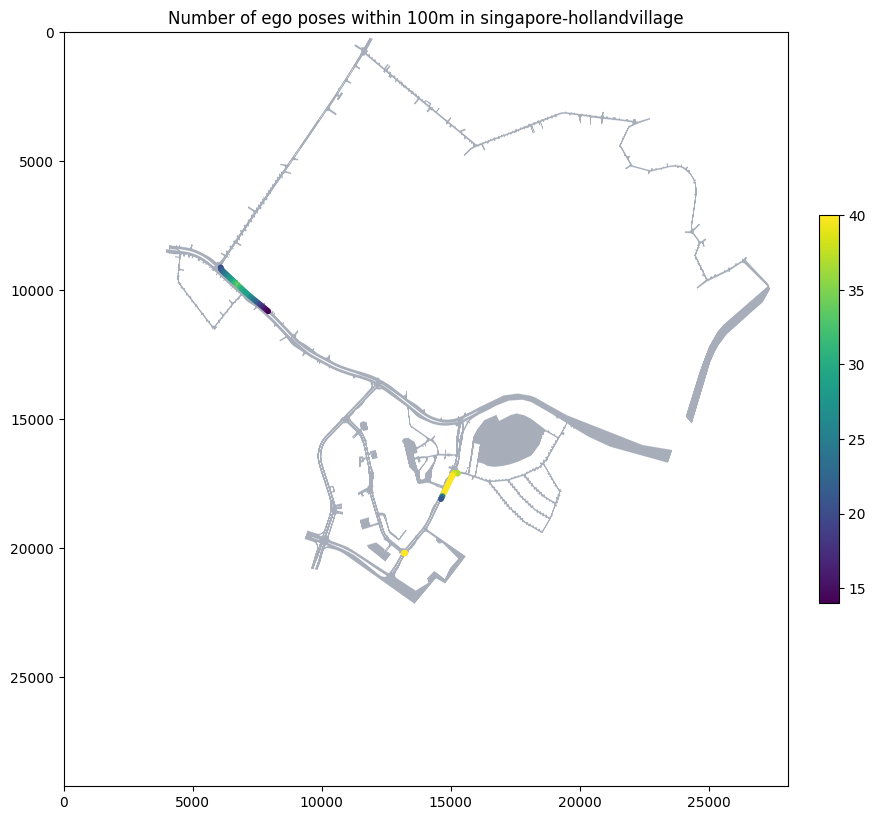

In [9]:
nusc.render_egoposes_on_map(log_location='singapore-hollandvillage')

### <a id="sample"></a> 4 - Sample

A cada 0,5 segundos (2Hz) um frame de uma cena é anotado (possui os *bounding boxes*). Quando isso ocorre em um frame, ele é chamado de **keyframe**

Um *sample* é um **keyframe**, possuindo as anotações e as entradas de todos os sensores em um momento semelhante para todos. As propriedades de cada *sample* são as seguintes:

```plain
sample {
   "token":                   <str> -- Identificador único do sample (igual um ID)
   "timestamp":               <int> -- Unix timestamp (é o momento em que o sample foi coletado os dados do sample)
   "scene_token":             <str> -- Chave estrangeira apontando para a cena que o sample faz parte
   "next":                    <str> -- Chave estrangeira apontando para o próximo sample da mesma cena. Será vazio se o sample atual for o último da cena
   "prev":                    <str> -- Chave estrangeira apontando para o sample anterior da mesma cena. Será vazio se o sample atual for o primeiro da cena
   "data"*: {                 <dict> -- Um dicionário com apontadores para os dados de todos os sensores nesse momento.
      'RADAR_FRONT':          <str> -- Chave estrangeira apontando para o sample_data do radar da frente
      'RADAR_FRONT_LEFT':     <str> -- Chave estrangeira apontando para o sample_data do radar da frente na esquerda
      'RADAR_FRONT_RIGHT':    <str> -- Chave estrangeira apontando para o sample_data do radar da frente na direita
      'RADAR_BACK_LEFT':      <str> -- Chave estrangeira apontando para o sample_data do radar de trás na esquerda
      'RADAR_BACK_RIGHT':     <str> -- Chave estrangeira apontando para o sample_data do radar de trás na direita
      'LIDAR_TOP':            <str> -- Chave estrangeira apontando para o sample_data do LiDAR
      'CAM_FRONT':            <str> -- Chave estrangeira apontando para o sample_data da câmera da frente
      'CAM_FRONT_RIGHT':      <str> -- Chave estrangeira apontando para o sample_data da câmera da frente na direita
      'CAM_BACK_RIGHT':       <str> -- Chave estrangeira apontando para o sample_data da câmera de trás na direita
      'CAM_BACK':             <str> -- Chave estrangeira apontando para o sample_data da câmera de trás
      'CAM_BACK_LEFT':        <str> -- Chave estrangeira apontando para o sample_data da câmera de trás na esquerda
      'CAM_FRONT_LEFT':       <str> -- Chave estrangeira apontando para o sample_data da câmera da frente na esquerda
   },
   "anns"*:                   <list> -- lista de chaves estrangeiras de anotações
}
```

\* Propriedades marcadas com asterisco (`data` e `anns`) não existem no *schema*. Estas propriedades são criadas pelo devkit, biblioteca que está sendo utilizada para interagir com os dados.



Na célula de código a seguir, o método `render_sample` é usado para mostrar imagens dos dados que podem ser acessados a partir de um sample. Esse método aceita um **token** (ID) de sample. Neste caso, o id enviado é do primeiro sample da primeira cena da base de dados.

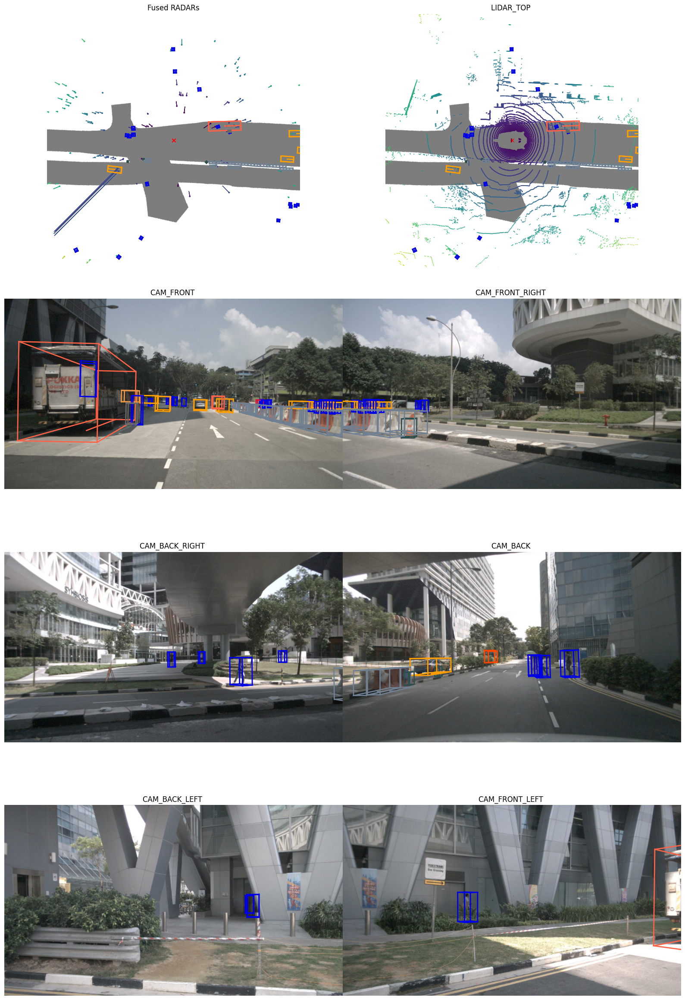

In [10]:
first_sample_token = my_scene['first_sample_token']
nusc.render_sample(first_sample_token)

O método **get** pode ser usado para coletar um registro específico da base de dados. O primeiro parâmetro dessa função é o nome da tabela que queremos acessar, que nesse caso é *sample*. O segundo parâmetro é um token especificando o registro que é desejado retornar.

No código abaixo, estamos coletando os dados do primeiro *sample* da primeira cena. OBS: Por se tratar do primeiro *sample*, o atributo "prev" é vazio.

In [11]:
my_sample = nusc.get('sample', first_sample_token)
my_sample

{'token': 'ca9a282c9e77460f8360f564131a8af5',
 'timestamp': 1532402927647951,
 'prev': '',
 'next': '39586f9d59004284a7114a68825e8eec',
 'scene_token': 'cc8c0bf57f984915a77078b10eb33198',
 'data': {'RADAR_FRONT': '37091c75b9704e0daa829ba56dfa0906',
  'RADAR_FRONT_LEFT': '11946c1461d14016a322916157da3c7d',
  'RADAR_FRONT_RIGHT': '491209956ee3435a9ec173dad3aaf58b',
  'RADAR_BACK_LEFT': '312aa38d0e3e4f01b3124c523e6f9776',
  'RADAR_BACK_RIGHT': '07b30d5eb6104e79be58eadf94382bc1',
  'LIDAR_TOP': '9d9bf11fb0e144c8b446d54a8a00184f',
  'CAM_FRONT': 'e3d495d4ac534d54b321f50006683844',
  'CAM_FRONT_RIGHT': 'aac7867ebf4f446395d29fbd60b63b3b',
  'CAM_BACK_RIGHT': '79dbb4460a6b40f49f9c150cb118247e',
  'CAM_BACK': '03bea5763f0f4722933508d5999c5fd8',
  'CAM_BACK_LEFT': '43893a033f9c46d4a51b5e08a67a1eb7',
  'CAM_FRONT_LEFT': 'fe5422747a7d4268a4b07fc396707b23'},
 'anns': ['ef63a697930c4b20a6b9791f423351da',
  '6b89da9bf1f84fd6a5fbe1c3b236f809',
  '924ee6ac1fed440a9d9e3720aac635a0',
  '91e3608f55174a319

A partir do atributo `next` do sample é possível imprimir uma sequência ordenada cronologicamente de acontecimentos de um sensor específico

In [12]:
my_sequence = []
token = nusc.get('sample', first_sample_token)
while token['next'] != '':
    my_sequence.append(token['next'])

    token = nusc.get('sample', token['next'])

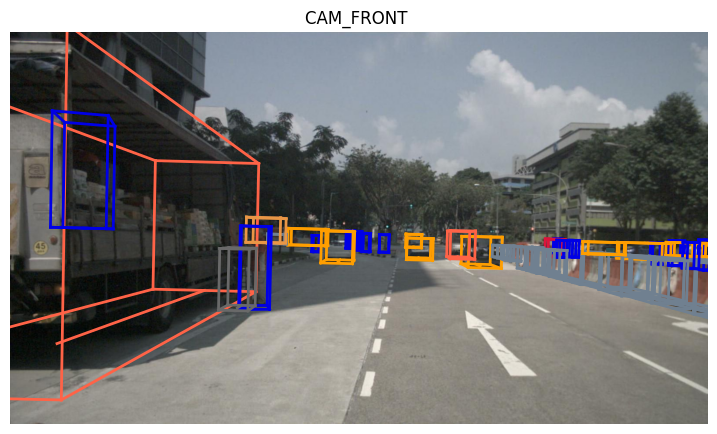

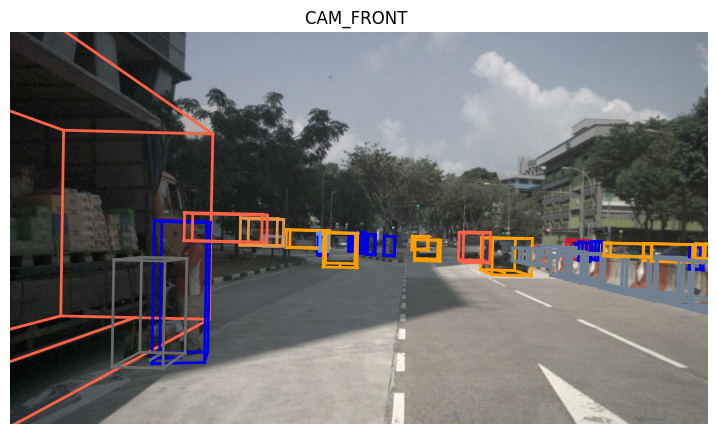

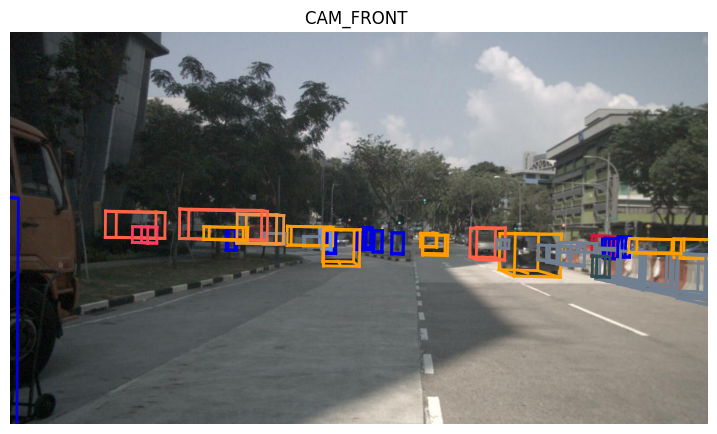

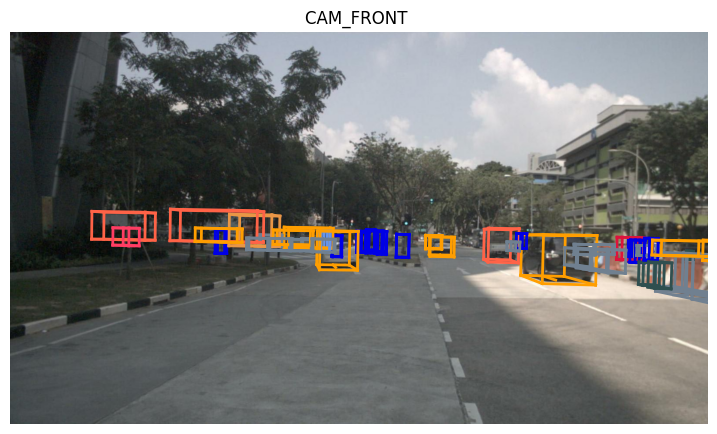

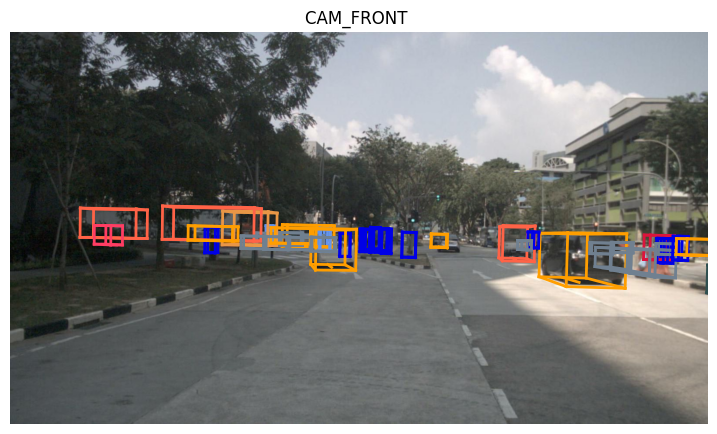

In [13]:
for tok in my_sequence[0:5]:
    sample_aux = nusc.get('sample', tok)
    nusc.render_sample_data(nusc.get('sample_data', sample_aux['data']['CAM_FRONT'])['token'])

### <a id="sample_data"></a> 5 - Sample data

Um registro da tabela `sample_data` é relacionado à um input de um dos sensores em um tempo específico. Este `sample_data` não precisa necessariamente possuir anotações (ser um **keyframe**). Todos os dados de um registro de `sample_data` são:

```plain
sample_data {
   "token":                   <str> -- Identificador único para o registro (igual um ID)
   "sample_token":            <str> -- Chave estrangeira para um sample. Caso o sample_data atual seja parte de um keyframe (is_key_frame = True), será apontado para o sample com timestamp igual ao timestamp atual. Caso contrário, irá apontar para o próximo sample com o timestamp mais próximo.
   "ego_pose_token":          <str> -- Chave estrangeira para informações de ego_pose
   "calibrated_sensor_token": <str> -- Chave estrangeira para informações de calibrated_sensor
   "filename":                <str> -- Caminho relativo para o input (por exemplo, uma imagem se for uma câmera)
   "fileformat":              <str> -- Formato do dado (extensão do arquivo)
   "width":                   <int> -- Se for uma imagem, é a largura da imagem em pixels.
   "height":                  <int> -- Se for uma imagem, é a altura da imagem em pixels.
   "timestamp":               <int> -- Unix timestamp (tempo em que o input foi coletado).
   "is_key_frame":            <bool> -- Será True se for parte de um keyframe (possui anotações), e False caso contrário
   "next":                    <str> -- Chave estrangeira apontando para o próximo sample_data do mesmo sensor. Será vazio se o sample_data atual for o último da cena
   "prev":                    <str> -- Chave estrangeira apontando para sample_data anterior do mesmo sensor. Será vazio se o sample_data atual for o primeiro da cena
   "sensor_modality"*:        <str> -- "camera", "lidar" ou "radar"
   "channel"*:                <str> -- chave única do sensor atual (e.g. "RADAR_FRONT", "CAM_FRONT", "LIDAR_TOP", etc.)
}
```

\* Propriedades marcadas com asterisco (`sensor_modality` e `channel`) não existem no *schema*. Estas propriedades são criadas pelo devkit, biblioteca que está sendo utilizada para interagir com os dados.

A seguir, é utilizado o método `get` novamente, só que dessa vez para coletar um registro da tabela `sample_data`. No código abaixo será coletado o registro do primeiro `sample_data` da câmera frontal da primeira cena. Por fazer parte de um *sample*, este *sample_data* será um **keyframe**, tendo sua propriedade `is_key_frame` como True.

In [14]:
sensor = 'CAM_FRONT'
cam_front_data = nusc.get('sample_data', my_sample['data'][sensor])
cam_front_data

{'token': 'e3d495d4ac534d54b321f50006683844',
 'sample_token': 'ca9a282c9e77460f8360f564131a8af5',
 'ego_pose_token': 'e3d495d4ac534d54b321f50006683844',
 'calibrated_sensor_token': '1d31c729b073425e8e0202c5c6e66ee1',
 'timestamp': 1532402927612460,
 'fileformat': 'jpg',
 'is_key_frame': True,
 'height': 900,
 'width': 1600,
 'filename': 'samples/CAM_FRONT/n015-2018-07-24-11-22-45+0800__CAM_FRONT__1532402927612460.jpg',
 'prev': '',
 'next': '68e8e98cf7b0487baa139df808641db7',
 'sensor_modality': 'camera',
 'channel': 'CAM_FRONT'}

A seguir, o método `render_sample_data` é utilizado para visualizar a imagem da câmera frontal. Por ser um **keyframe**, as anotações podem ser imprimidas de forma original (exatamente da forma que foi anotado).

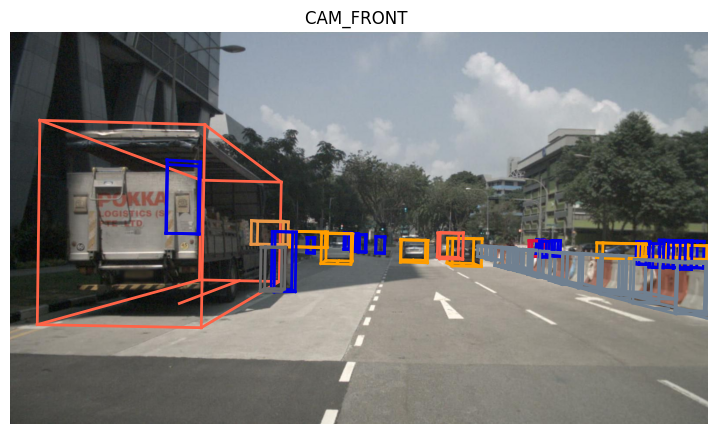

In [15]:
nusc.render_sample_data(cam_front_data['token'])

Agora, fazendo o mesmo para a próxima imagem do mesmo sensor, é possível perceber que ele não é um **keyframe**, ou seja, não possui anotações diretas.

In [16]:
next_cam_front_data = nusc.get('sample_data', cam_front_data['next'])
next_cam_front_data

{'token': '68e8e98cf7b0487baa139df808641db7',
 'sample_token': '39586f9d59004284a7114a68825e8eec',
 'ego_pose_token': '68e8e98cf7b0487baa139df808641db7',
 'calibrated_sensor_token': '1d31c729b073425e8e0202c5c6e66ee1',
 'timestamp': 1532402927662460,
 'fileformat': 'jpg',
 'is_key_frame': False,
 'height': 900,
 'width': 1600,
 'filename': 'sweeps/CAM_FRONT/n015-2018-07-24-11-22-45+0800__CAM_FRONT__1532402927662460.jpg',
 'prev': 'e3d495d4ac534d54b321f50006683844',
 'next': '512015c209c1490f906982c3b182c2a8',
 'sensor_modality': 'camera',
 'channel': 'CAM_FRONT'}

Também é possível visualizar essa próxima imagem. Nessa próxima imagem, ainda podemos ver as anotações, porém, estas são estimativas feitas a partir de uma interpolação linear entre a anotação anterior e a próxima (essa informação foi retirada do [próprio código da biblioteca](https://github.com/nutonomy/nuscenes-devkit/blob/master/python-sdk/nuscenes/nuscenes.py#L319-L375)).

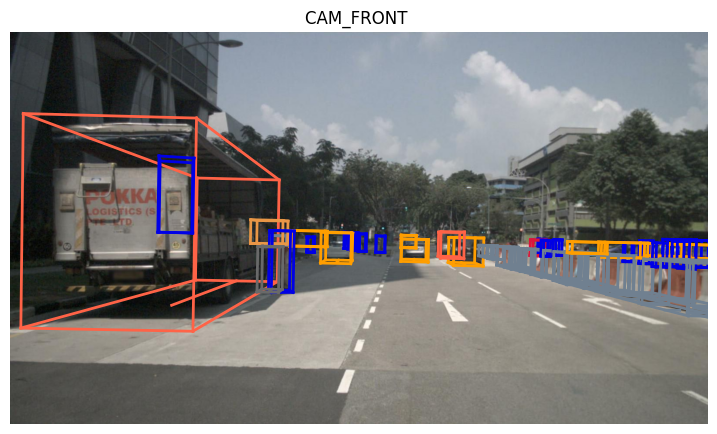

In [17]:
nusc.render_sample_data(next_cam_front_data['token'])

Também é possível acessar os dados de outros tipos de sensores, como LiDAR e RADAR. As próximas células de código acessam dados desses outros sensores.

In [18]:
sensor = 'RADAR_FRONT'
radar_front_data = nusc.get('sample_data', my_sample['data'][sensor])
radar_front_data

{'token': '37091c75b9704e0daa829ba56dfa0906',
 'sample_token': 'ca9a282c9e77460f8360f564131a8af5',
 'ego_pose_token': '37091c75b9704e0daa829ba56dfa0906',
 'calibrated_sensor_token': 'f4d2a6c281f34a7eb8bb033d82321f79',
 'timestamp': 1532402927664178,
 'fileformat': 'pcd',
 'is_key_frame': True,
 'height': 0,
 'width': 0,
 'filename': 'samples/RADAR_FRONT/n015-2018-07-24-11-22-45+0800__RADAR_FRONT__1532402927664178.pcd',
 'prev': '',
 'next': 'f0b8593e08594a3eb1152c138b312813',
 'sensor_modality': 'radar',
 'channel': 'RADAR_FRONT'}

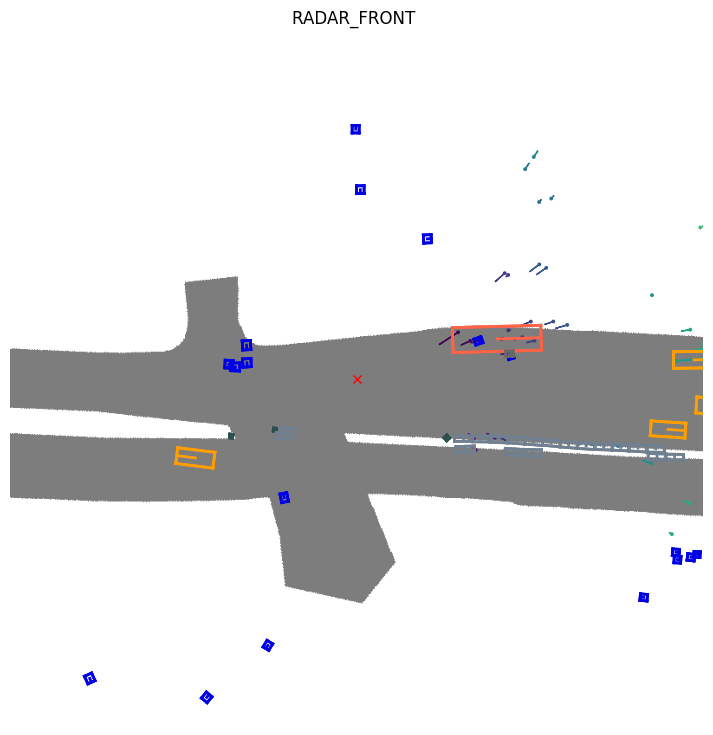

In [19]:
nusc.render_sample_data(radar_front_data['token'])

In [20]:
sensor = 'LIDAR_TOP'
lidar_top_data = nusc.get('sample_data', my_sample['data'][sensor])
lidar_top_data

{'token': '9d9bf11fb0e144c8b446d54a8a00184f',
 'sample_token': 'ca9a282c9e77460f8360f564131a8af5',
 'ego_pose_token': '9d9bf11fb0e144c8b446d54a8a00184f',
 'calibrated_sensor_token': 'a183049901c24361a6b0b11b8013137c',
 'timestamp': 1532402927647951,
 'fileformat': 'pcd',
 'is_key_frame': True,
 'height': 0,
 'width': 0,
 'filename': 'samples/LIDAR_TOP/n015-2018-07-24-11-22-45+0800__LIDAR_TOP__1532402927647951.pcd.bin',
 'prev': '',
 'next': '0cedf1d2d652468d92d23491136b5d15',
 'sensor_modality': 'lidar',
 'channel': 'LIDAR_TOP'}

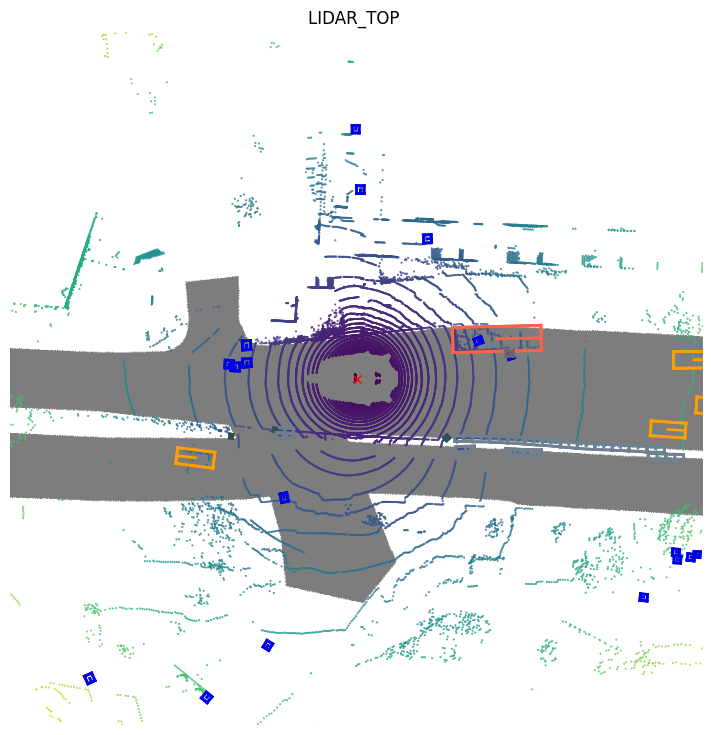

In [21]:
nusc.render_sample_data(lidar_top_data['token'])

Juntando as estruturas de dados de *scenes*, *sample* e *sample_data*, podemos visualizar suas relações a partir da seguinte ilustração:

<center>
    <img alt="scene sample and sample_data structure ilustration" src="../../images/scene-sample-data-structure.png">
</center>

### <a id="ego_pose"></a> 6 - Ego pose

Os registros de `ego_pose` são relacionados à localização e rotação do veículo em um determinado momento de coleta de input. Todo `sample_data` possui um token de `ego_pose`, que pode ser usado para coletar informações da situação do veículo no momento da coleta da informação. As propriedades desta tabela são as seguintes:

```plain
ego_pose {
   "token":                   <str> -- Identificador único de um ego_pose (igual um ID)
   "translation":             <float> [3] -- Posição do veículo em metros
   "rotation":                <float> [4] -- Rotação do veículo
   "timestamp":               <int> -- Unix timestamp (momento em que essa informação foi coletada)
}
```

OBS: é dito que no *paper* sobre a nuScenes é disponibilizado mais informações de como foram coletados esses registros, possivelmente explicando melhor como utilizá-los

O código abaixo coleta as informações do veículo da primeira imagem da câmera frontal da primeira cena. Para isso, é usado o método `get`.

In [22]:
nusc.get('ego_pose', cam_front_data['ego_pose_token'])

{'token': 'e3d495d4ac534d54b321f50006683844',
 'timestamp': 1532402927612460,
 'rotation': [0.5720063498929273,
  -0.0021434844534272707,
  0.011564094980151613,
  -0.8201648693182716],
 'translation': [411.4199861830012, 1181.197175631848, 0.0]}

### <a id="calibrated_sensor"></a> 7- Calibrated sensor

A tabela com os sensores calibrados dá a cada um dos sensores algumas variações de rotação e translação de acordo com a calibração feita em um veículo específico, dessa forma, ao ter conhecimento sobre um veículo, é possível saber como cada um dos sensores utilizados por ele foi calibrado.

In [23]:
print (type(nusc.calibrated_sensor))
print (type(nusc.calibrated_sensor[0]))
nusc.calibrated_sensor[0]

<class 'list'>
<class 'dict'>


{'token': 'f4d2a6c281f34a7eb8bb033d82321f79',
 'sensor_token': '47fcd48f71d75e0da5c8c1704a9bfe0a',
 'translation': [3.412, 0.0, 0.5],
 'rotation': [0.9999984769132877, 0.0, 0.0, 0.0017453283658983088],
 'camera_intrinsic': []}

### <a id="sensor"></a> 8- Sensor

A tabela com os sensores nada mais faz do que armazenar todos os sensores disponíveis, classificando-os com um canal e uma modalidade.

In [24]:
print (type(nusc.sensor))
print (type(nusc.sensor[0]))
nusc.sensor

<class 'list'>
<class 'dict'>


[{'token': '725903f5b62f56118f4094b46a4470d8',
  'channel': 'CAM_FRONT',
  'modality': 'camera'},
 {'token': 'ce89d4f3050b5892b33b3d328c5e82a3',
  'channel': 'CAM_BACK',
  'modality': 'camera'},
 {'token': 'a89643a5de885c6486df2232dc954da2',
  'channel': 'CAM_BACK_LEFT',
  'modality': 'camera'},
 {'token': 'ec4b5d41840a509984f7ec36419d4c09',
  'channel': 'CAM_FRONT_LEFT',
  'modality': 'camera'},
 {'token': '2f7ad058f1ac5557bf321c7543758f43',
  'channel': 'CAM_FRONT_RIGHT',
  'modality': 'camera'},
 {'token': 'ca7dba2ec9f95951bbe67246f7f2c3f7',
  'channel': 'CAM_BACK_RIGHT',
  'modality': 'camera'},
 {'token': 'dc8b396651c05aedbb9cdaae573bb567',
  'channel': 'LIDAR_TOP',
  'modality': 'lidar'},
 {'token': '47fcd48f71d75e0da5c8c1704a9bfe0a',
  'channel': 'RADAR_FRONT',
  'modality': 'radar'},
 {'token': '232a6c4dc628532e81de1c57120876e9',
  'channel': 'RADAR_FRONT_RIGHT',
  'modality': 'radar'},
 {'token': '1f69f87a4e175e5ba1d03e2e6d9bcd27',
  'channel': 'RADAR_FRONT_LEFT',
  'modality'

### <a id="sample_annotation"></a> 9 - Sample annotation

A partir de um sample, é possível acessar todas as anotações feitas em um certo **keyframe**. Na lista `anns` de um sample existem várias chaves estrangeiras para `sample_annotation`. Cada `sample_annotation` possui uma anotação (*bounding box*) de um objeto específico em um certo momento. As propriedades de um registro dessa tabela são as seguintes:

```plain
sample_annotation {
   "token":                   <str> -- Identificar único de um sample annotation (igual a um ID)
   "sample_token":            <str> -- Chave estrangeira para o sample que essa anotação faz parte
   "instance_token":          <str> -- Chave estrangeira para a instância que essa anotação faz parte. Uma instância é o objeto que está sendo identificado em si (um carro, um pedestre) ao longo de uma cena. Um objeto/instância pode possuir várias anotações ao longo de uma cena
   "attribute_tokens":        <str> [n] -- Lista de chaves estrangeiras para atributos. Atributos podem mudar ao longo do tempo, por isso é colocado aqui ao invés de colocar diretamente na instância (o objeto pode mudar seus atributos ao longo de uma cena)
   "visibility_token":        <str> -- Chave estrangeira para informações a respeito de visibilidade. Pode ser uma string vazia se não tiver informações sobre a visibilidade desta anotação
   "translation":             <float> [3] -- Centro da bounding box: center_x, center_y, center_z
   "size":                    <float> [3] -- Bounding box size in meters as width, length, height. Tamanho da bounding box em metros: largura, comprimento e altura
   "rotation":                <float> [4] -- Rotação/orientação da bounding box: w, x, y, z.
   "num_lidar_pts":           <int> -- Número de pontos de LiDAR neste objeto em uma varredura de LiDAR
   "num_radar_pts":           <int> -- Número de pontos de RADAR neste objeto. Todos as varreduras de RADAR são contadas, sem fazer uma filtragem.
   "next":                    <str> -- Chave estrangeira para a próxima anotação dessa mesma instância/objeto. È vazio se for a última anotação.
   "prev":                    <str> -- Chave estrangeira para a anotação anterior dessa mesma instância/objeto. É vazio se for a primeira anotação.
}
```

O código abaixo coleta o sample_annotation de um caminhão da primeira cena.

In [25]:
my_annotation_token = my_sample['anns'][18]
my_annotation_metadata =  nusc.get('sample_annotation', my_annotation_token)
my_annotation_metadata

{'token': '83d881a6b3d94ef3a3bc3b585cc514f8',
 'sample_token': 'ca9a282c9e77460f8360f564131a8af5',
 'instance_token': 'e91afa15647c4c4994f19aeb302c7179',
 'visibility_token': '4',
 'attribute_tokens': ['58aa28b1c2a54dc88e169808c07331e3'],
 'translation': [409.989, 1164.099, 1.623],
 'size': [2.877, 10.201, 3.595],
 'rotation': [-0.5828819500503033, 0.0, 0.0, 0.812556848660791],
 'prev': '',
 'next': 'f3721bdfd7ee4fd2a4f94874286df471',
 'num_lidar_pts': 495,
 'num_radar_pts': 13,
 'category_name': 'vehicle.truck'}

Com o token desta anotação é possível renderizá-la a partir do método `render_annotation`.

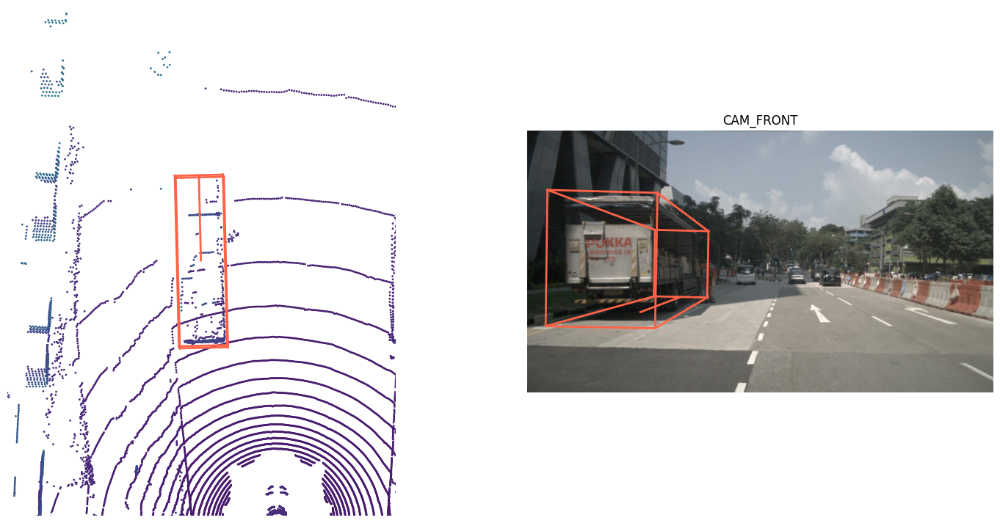

In [26]:
nusc.render_annotation(my_annotation_token)

### <a id="visibility"></a> 10 - Visibility

Cada sample_annotation também possui dados sobre sua visibilidade. Este informará o quão visível o objeto/instância é a partir dos dados capturados a partir do sensor. Esta é uma tabela bem pequena, pois são poucas categorias de visibilidade de objetos. No caso, temos 4 níveis de visibilidade:

- **Nível 1:** 0 a 40% dos pixels são visíveis 
- **Nível 2:** 40 a 60% dos pixels são visíveis
- **Nível 3:** 60 a 80% dos pixels são visíveis
- **Nível 4:** 80 a 100% dos pixels são visíveis

OBS: Nesse cálculo de visibilidade são consideradas as imagens de todas as câmeras.

Os atributos dessa pequena tabela são:

```plain
visibility {
   "token":                   <str> -- Identificador único de visibilidade (aqui é o nível de visiblidade: 1, 2, 3 ou 4)
   "level":                   <str> -- Porcentagem de visibilidade no formato (v<min-visibility>-<max-visibility>)
   "description":             <str> -- Descrição desse nível de visibilidade
}
```

Por se tratar de uma tabela pequena (apenas 4 registros), é possível imprimí-la completamente no comando abaixo

In [27]:
nusc.visibility

[{'description': 'visibility of whole object is between 0 and 40%',
  'token': '1',
  'level': 'v0-40'},
 {'description': 'visibility of whole object is between 40 and 60%',
  'token': '2',
  'level': 'v40-60'},
 {'description': 'visibility of whole object is between 60 and 80%',
  'token': '3',
  'level': 'v60-80'},
 {'description': 'visibility of whole object is between 80 and 100%',
  'token': '4',
  'level': 'v80-100'}]

Podemos analisar os dados de visibilidade do caminhão que temos na primeira imagem da primeira cena. Ele está bem visível pela câmera, com praticamente nenhum pixel de oclusão, fazendo com que ele entre no nível de visibilidade maior possível (4).

In [28]:
nusc.get('visibility', my_annotation_metadata['visibility_token'])

{'description': 'visibility of whole object is between 80 and 100%',
 'token': '4',
 'level': 'v80-100'}

Agora, pegando outro objeto com menor visibilidade (level 1: 0 a 40%), temos o seguinte exemplo:

Visibility: {'description': 'visibility of whole object is between 0 and 40%', 'token': '1', 'level': 'v0-40'}


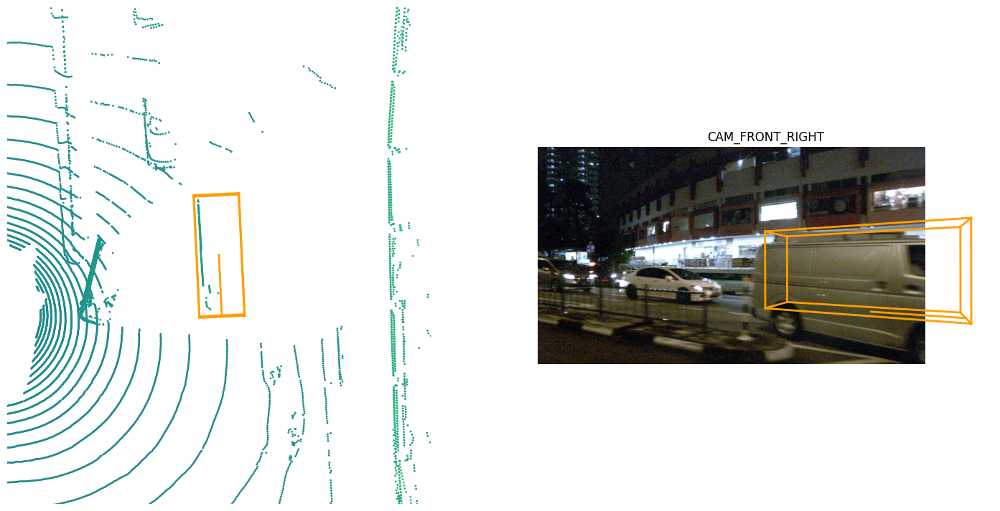

In [29]:
anntoken = '9f450bf6b7454551bbbc9a4c6e74ef2e'
visibility_token = nusc.get('sample_annotation', anntoken)['visibility_token']

print("Visibility: {}".format(nusc.get('visibility', visibility_token)))
nusc.render_annotation(anntoken)

O bounding box é referente à um caminha que está com muita pouca visibilidade, já que está sendo em sua grande maioria tampado com outro veículo

### <a id="attribute"></a> 11 - Attribute

Cada `sample_annotation` também possui uma lista de atributos. Estes atributos são caracteristicas do objeto que podem mudar ao decorrer de uma cena. Por exemplo, estacionado é considerado um atributo, pois um veículo pode passar a ser pilotado durante uma cena, mudando assim o seu atributo. Para informações estáticas, como por exemplo, ser um veículo, é utilizado a tabela `category`.

As propriedades de tabela `attribute` são as seguintes:

```plain
attribute {
   "token":                   <str> -- Identificador único do atributo
   "name":                    <str> -- Nome do atributo. Segue o padrão <nome-instância>.<nome-ação> (e.g. vehicle.parked)
   "description":             <str> -- Descrição do atributo
}
```

Não existem muitos atributos diferentes, então é possível visualizá-los todos com o comando abaixo

In [30]:
nusc.attribute

[{'token': 'cb5118da1ab342aa947717dc53544259',
  'name': 'vehicle.moving',
  'description': 'Vehicle is moving.'},
 {'token': 'c3246a1e22a14fcb878aa61e69ae3329',
  'name': 'vehicle.stopped',
  'description': 'Vehicle, with a driver/rider in/on it, is currently stationary but has an intent to move.'},
 {'token': '58aa28b1c2a54dc88e169808c07331e3',
  'name': 'vehicle.parked',
  'description': 'Vehicle is stationary (usually for longer duration) with no immediate intent to move.'},
 {'token': 'a14936d865eb4216b396adae8cb3939c',
  'name': 'cycle.with_rider',
  'description': 'There is a rider on the bicycle or motorcycle.'},
 {'token': '5a655f9751944309a277276b8f473452',
  'name': 'cycle.without_rider',
  'description': 'There is NO rider on the bicycle or motorcycle.'},
 {'token': '03aa62109bf043afafdea7d875dd4f43',
  'name': 'pedestrian.sitting_lying_down',
  'description': 'The human is sitting or lying down.'},
 {'token': '4d8821270b4a47e3a8a300cbec48188e',
  'name': 'pedestrian.standi

Para verificar a mudança de atributo de um objeto, o código abaixo pode ser usado. Neste caso específico estamos verificando um objeto pedestre que estava andando e depois parou

In [31]:
my_instance = nusc.instance[27]
first_token = my_instance['first_annotation_token']
last_token = my_instance['last_annotation_token']
nbr_samples = my_instance['nbr_annotations']
current_token = first_token

i = 0
found_change = False
while current_token != last_token:
    current_ann = nusc.get('sample_annotation', current_token)
    current_attr = nusc.get('attribute', current_ann['attribute_tokens'][0])['name']
    
    if i == 0:
        pass
    elif current_attr != last_attr:
        print("Changed from `{}` to `{}` at timestamp {} out of {} annotated timestamps".format(last_attr, current_attr, i, nbr_samples))
        found_change = True

    next_token = current_ann['next']
    current_token = next_token
    last_attr = current_attr
    i += 1

Changed from `pedestrian.moving` to `pedestrian.standing` at timestamp 21 out of 39 annotated timestamps


### <a id="instance"></a> 12 - Instance

Uma instância é um objeto anotado que se repete ao longo de uma cena. Por exemplo, um carro que aparece em várias imagens de uma mesma cena é uma instância. Com uma instância é possível obter todas as anotações (*bounding boxes*) deste objeto ao longo da cena. As propriedades desta tabela são as seguintes:

```plain
instance {
   "token":                   <str> -- Identificador único da instância
   "category_token":          <str> -- Chave estrangeira para informações a respeito da categoria do objeto.
   "nbr_annotations":         <int> -- Número de anotações existentes para essa instância na cena
   "first_annotation_token":  <str> -- Chave estrangeira para o primeiro registro de anotações da instância
   "last_annotation_token":   <str> -- Chave estrangeira para o último registro de anotações da instância
}
```

A partir de um `sample_annotation` de um caminhão na primeira cena, coseguimos resgatar as informações (metadados) da instância desse caminhão em específico

In [32]:
truck_instance_metadata = nusc.get('instance', my_annotation_metadata['instance_token'])
truck_instance_metadata

{'token': 'e91afa15647c4c4994f19aeb302c7179',
 'category_token': '6021b5187b924d64be64a702e5570edf',
 'nbr_annotations': 30,
 'first_annotation_token': '83d881a6b3d94ef3a3bc3b585cc514f8',
 'last_annotation_token': '91fa82612eea49bfacc4f128f5fd68a3'}

A partir desse metadado conseguimos acessar o primeiro sample_annotation desse objeto e renderizá-lo

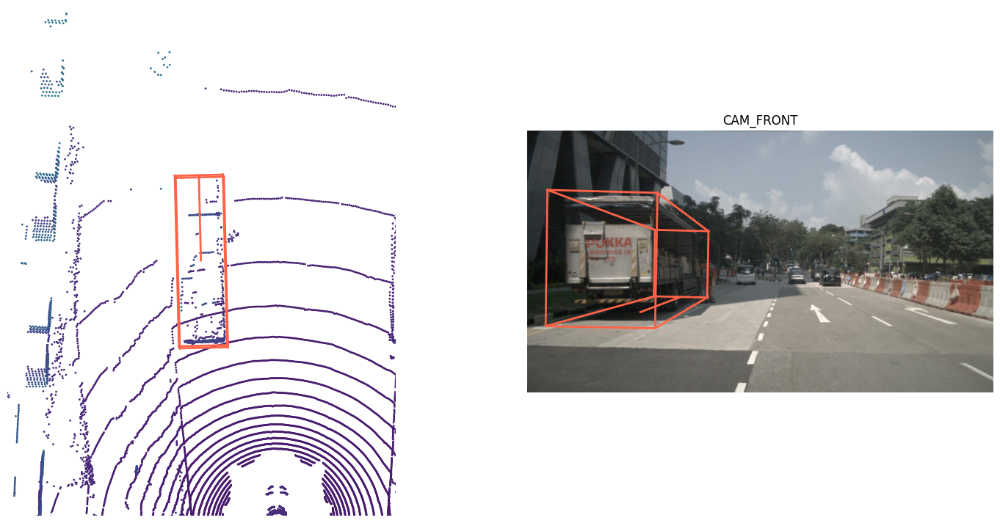

In [33]:
nusc.render_annotation(truck_instance_metadata['first_annotation_token'])

Também conseguimos renderizar o último frame em que esse objeto esta em cena

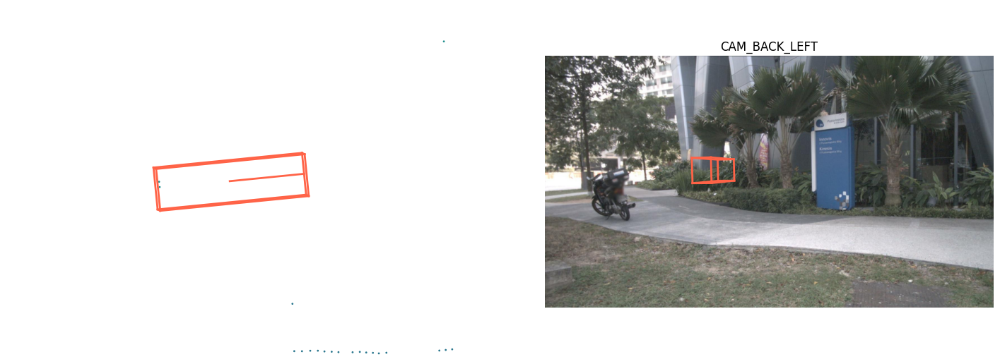

In [34]:
nusc.render_annotation(truck_instance_metadata['last_annotation_token'])

### <a id="category"></a> 13 - Category

Categoria especifica o que uma instância é de fato. A categoria identifica um objeto de forma estática, ou seja, se um objeto possui uma categoria durante uma cena, esta categoria será perdurada até o fim da cena. Por exemplo, uma categoria possível é carro. Não é possível que um carro se torne em outra coisa enquanto a cena estiver decorrendo.

```plain
category {
   "token":                   <str> -- Identificador único de uma categoria
   "name":                    <str> -- Nome da categoria no seguinte padrão: <categoria-principal>.<subcategoria1>.<subcategoria2?> (e.g. human.pedestrian.adult e vehicle.truck)
   "description":             <str> -- Descrição da categoria
   "index":                   <int> -- Um índice usado por necessidades de eficiência.
}
```

Por não se tratar de uma tabela muito grande, é possível visualizá-la por completo no comando abaixo

In [35]:
nusc.category

[{'token': '1fa93b757fc74fb197cdd60001ad8abf',
  'name': 'human.pedestrian.adult',
  'description': 'Adult subcategory.'},
 {'token': 'b1c6de4c57f14a5383d9f963fbdcb5cb',
  'name': 'human.pedestrian.child',
  'description': 'Child subcategory.'},
 {'token': 'b2d7c6c701254928a9e4d6aac9446d79',
  'name': 'human.pedestrian.wheelchair',
  'description': 'Wheelchairs. If a person is in the wheelchair, include in the annotation.'},
 {'token': '6a5888777ca14867a8aee3fe539b56c4',
  'name': 'human.pedestrian.stroller',
  'description': 'Strollers. If a person is in the stroller, include in the annotation.'},
 {'token': '403fede16c88426885dd73366f16c34a',
  'name': 'human.pedestrian.personal_mobility',
  'description': 'A small electric or self-propelled vehicle, e.g. skateboard, segway, or scooters, on which the person typically travels in a upright position. Driver and (if applicable) rider should be included in the bounding box along with the vehicle.'},
 {'token': 'bb867e2064014279863c71a29b1

O devkit da nuscenes também permite analisarmos a quantidade de cada categoria na base de dados, assim como outras informações relevantes de cada categoria

In [36]:
nusc.list_categories()

Category stats for split v1.0-mini:
human.pedestrian.adult      n= 4765, width= 0.68±0.11, len= 0.73±0.17, height= 1.76±0.12, lw_aspect= 1.08±0.23
human.pedestrian.child      n=   46, width= 0.46±0.08, len= 0.45±0.09, height= 1.37±0.06, lw_aspect= 0.97±0.05
human.pedestrian.constructi n=  193, width= 0.69±0.07, len= 0.74±0.12, height= 1.78±0.05, lw_aspect= 1.07±0.16
human.pedestrian.personal_m n=   25, width= 0.83±0.00, len= 1.28±0.00, height= 1.87±0.00, lw_aspect= 1.55±0.00
human.pedestrian.police_off n=   11, width= 0.59±0.00, len= 0.47±0.00, height= 1.81±0.00, lw_aspect= 0.80±0.00
movable_object.barrier      n= 2323, width= 2.32±0.49, len= 0.61±0.11, height= 1.06±0.10, lw_aspect= 0.28±0.09
movable_object.debris       n=   13, width= 0.43±0.00, len= 1.43±0.00, height= 0.46±0.00, lw_aspect= 3.35±0.00
movable_object.pushable_pul n=   82, width= 0.51±0.06, len= 0.79±0.10, height= 1.04±0.20, lw_aspect= 1.55±0.18
movable_object.trafficcone  n= 1378, width= 0.47±0.14, len= 0.45±0.07, heigh

Podemos acessar a categoria de uma instância a partir da propriedade `category_token`. Vamos fazer isso para o caminhão da primeira cena

In [37]:
nusc.get('category', truck_instance_metadata['category_token'])

{'token': '6021b5187b924d64be64a702e5570edf',
 'name': 'vehicle.truck',
 'description': 'Vehicles primarily designed to haul cargo including pick-ups, lorrys, trucks and semi-tractors. Trailers hauled after a semi-tractor should be labeled as vehicle.trailer'}

Também podemos observar a frequência de cada categoria dentro de um sample

In [38]:
annotated_catgeories = []
for ann in my_sample['anns']:
    annotated_catgeories.append(nusc.get('sample_annotation', ann)['category_name'])

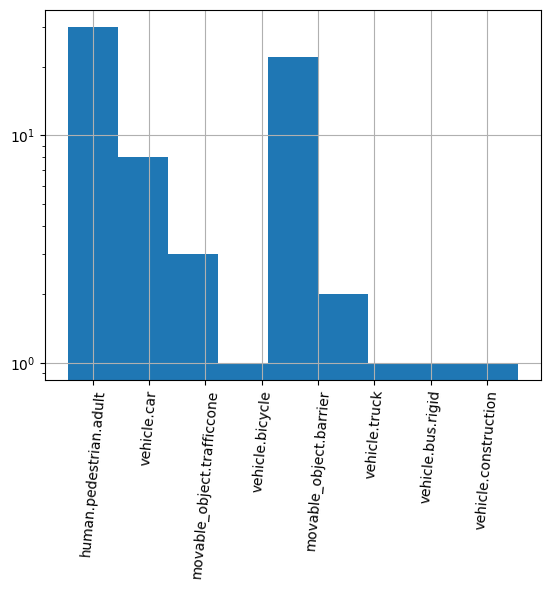

In [39]:
plt.hist(annotated_catgeories, log=True, bins=len(set(annotated_catgeories)), align='left')
plt.grid(True)
plt.xticks(rotation=85)
plt.show()

## Extras

Algumas informações não são relacionadas à nenhuma tabela diretamente e não foram abordadas na seção abaixo. Esta seção aborda alguns tópicos úteis que foram descobertos ao longo do uso da base de dados nuScenes (para o treinamento de modelos).

### Coletando tokens a partir do valor de alguma outra propriedade

As vezes precisamos coletar os tokens (ids) a partir de outras propriedades para assim podermos ter acesso à registros completos. Esse conhecimento é útil, por exemplo, para fazer o split de treino/validação/teste descrito no próximo tópico.

A função `field2token` pode ser usada para essa finalidade. Essa função recebe os seguintes parâmetros:
- `table_name`: nome da tabela em que será feito a busca
- `attribute_name`: nome do atributo em que o valor será buscado
- `query_value`: valor que será buscado

Essa função retornará uma lista contendo todos os tokens de registros que possuem o valor buscado.

A seguir, será coletado um token de cena a partir do nome de uma cena.

In [40]:
my_scene_token = nusc.field2token('scene', 'name', 'scene-0061')[0]
my_scene = nusc.get('scene', my_scene_token)
print(my_scene)

{'token': 'cc8c0bf57f984915a77078b10eb33198', 'log_token': '7e25a2c8ea1f41c5b0da1e69ecfa71a2', 'nbr_samples': 39, 'first_sample_token': 'ca9a282c9e77460f8360f564131a8af5', 'last_sample_token': 'ed5fc18c31904f96a8f0dbb99ff069c0', 'name': 'scene-0061', 'description': 'Parked truck, construction, intersection, turn left, following a van'}


Também é possível retornar, por exemplo, todos `sample_annotations` de uma instância utilizando esse método. Vamos fazer isso para aquele caminhão da primeira cena

In [41]:
truck_sample_annotations = nusc.field2token('sample_annotation', 'instance_token', truck_instance_metadata['token'])
truck_sample_annotations

['c3fc50bcdf5548ff99712a8daa057772',
 '83d881a6b3d94ef3a3bc3b585cc514f8',
 '7d616ddd17fb4b4ab4aa81ce3403dd94',
 '71eeb9af2a9a40ffbdc836f1694d99ce',
 '9a11184914c24739b5e36ea801b1e567',
 '495349323ae54e70b8c706f7a7e2d9ae',
 'a362ccc1c6ac4e0e88703e44cac714d9',
 '1a59783e6dff4c698a0c2ab8cd666cd3',
 'd47c0ed0b43a461ea099c00fadf0ed74',
 'e4c83ce1a39342c68a0b41bd3e29f850',
 '4fc2c86cf0db4c7290831b39e6adf8d8',
 'c75351bf3f3946a3a0ba883c861e11f8',
 '8e49ffc47c1d419a88ab5884aa5d1c7b',
 '2db1d33870f74352a00c3414be7a5c6c',
 '166b98d386b7468984ee527a0b9c0166',
 '1edcb7e44daa423993f72ae3c6861925',
 '3b1c9f82380a4ecdaf43febdfdbcc0a8',
 'e2982c6c0d8940bca5bc5ea8dab1bc78',
 'f3721bdfd7ee4fd2a4f94874286df471',
 'd07c8851357a47f7b1673ef4678e998b',
 '54a2684391424e44b2d7e5ce3b56d02e',
 '2da4606002f640d9973cb3e2ea4f762d',
 'c30d7915025b481c82b5480bacbe1aad',
 'f924de40bc474915a39724b46897e1a4',
 '91fa82612eea49bfacc4f128f5fd68a3',
 '3fb243e4e45240a3a03073da7d493fab',
 '70e2995ba6db4dcebc898a6a8270e86d',
 

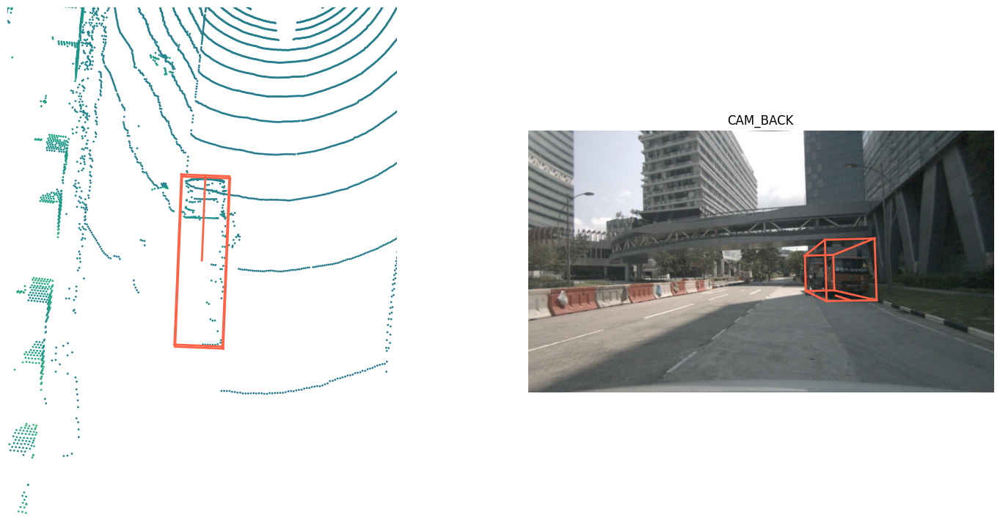

In [42]:
nusc.render_annotation(truck_sample_annotations[0])

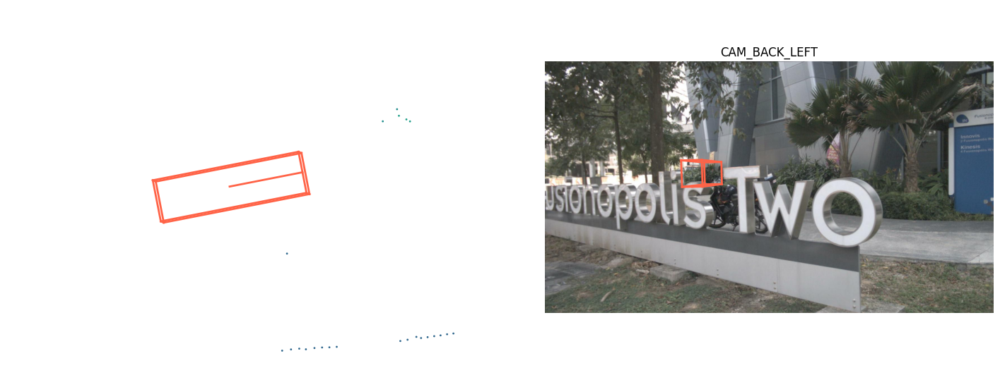

In [43]:
nusc.render_annotation(truck_sample_annotations[-1])

### Como fazer o split de treino/validação/teste

A base de dados da nuScenes fornece um split próprio, especificando quais cenas fazem parte do treino, validação ou teste. Para obter essa informação a função `create_splits_scenes()` pode ser usada.

Essa função retorna um dicionário contendo listas de nomes de cenas para cada split. A seguir, algumas das chaves importantes deste dicionário:

- `mini_train`: lista de nomes de cenas de treino da base mini
- `mini_val`: lista de nomes de cenas de validação da base mini
- `train`: lista de nomes de cenas de treino da base completa
- `val`: lista de nomes de cenas de validação da base completa


Mais informações sobre essa função pode ser consultada no [próprio código da biblioteca](https://github.com/nutonomy/nuscenes-devkit/blob/master/python-sdk/nuscenes/utils/splits.py)

A seguir coletaremos os nomes das cenas de treino e validação da base mini

In [46]:
splits = create_splits_scenes()

train_scenes = splits['mini_train']
val_scenes = splits['mini_val']

print(f'Train scenes: {train_scenes}')
print(f'Validation scenes: {val_scenes}')

Train scenes: ['scene-0061', 'scene-0553', 'scene-0655', 'scene-0757', 'scene-0796', 'scene-1077', 'scene-1094', 'scene-1100']
Validation scenes: ['scene-0103', 'scene-0916']


É possível usar o método `field2token` para coletar as informações da primeira cena de treino

In [47]:
my_scene_token = nusc.field2token('scene', 'name', train_scenes[0])[0]
my_scene = nusc.get('scene', my_scene_token)
print(my_scene)

{'token': 'cc8c0bf57f984915a77078b10eb33198', 'log_token': '7e25a2c8ea1f41c5b0da1e69ecfa71a2', 'nbr_samples': 39, 'first_sample_token': 'ca9a282c9e77460f8360f564131a8af5', 'last_sample_token': 'ed5fc18c31904f96a8f0dbb99ff069c0', 'name': 'scene-0061', 'description': 'Parked truck, construction, intersection, turn left, following a van'}


### Transformação das bounding boxes 3D em 2D

As anotações das caixas na base de dados são em 3D, enquanto que modelos mais básicos como YOLO, Faster R-CNN e SSD utilizam apenas caixas 2D em seu treinamento. Para conseguir treinar estes modelos na base de dados da nuScenes é preciso primeiro converter as caixas de 3D para 2D.

A própria biblioteca disponibiliza formas de [converter de boxes 3D para 2D](https://github.com/nutonomy/nuscenes-devkit/blob/master/python-sdk/nuscenes/scripts/export_2d_annotations_as_json.py).

Essa conversão também foi feita [neste notebook](https://github.com/asvath/mobile_robotics/blob/master/nuscenes%20extract%20and%20write%20out%202d%20annotation%20boxes-revised%20to%20truncate%20bb.ipynb).

Utilizando estes códigos acima, foi criado um código para conversão próprio, disponível neste mesmo repositório, nos links abaixo:

- [código de conversão]()
- [notebook testando este código]()